First thing you should do is carefully read the entire README.MD here https://github.com/fizyr/keras-retinanet

Let's download the safety images from an azure blob 

In [1]:
import os
import shutil
import requests
from io import BytesIO
from PIL import Image

# Create an empty folder
folder = 'safety_images'
if os.path.exists(folder):
    shutil.rmtree(folder)
os.makedirs(folder)

# Get the list of image URLs
!curl https://challenge.blob.core.windows.net/challengefiles/summit_post_urls_selected.txt -o urls.txt
urls = open("urls.txt", "r")

# Download each image
for url in urls.readlines():
    url = url.rstrip()
    filename = url.split('/')[-1]
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    saveAs = os.path.join(folder, filename)
    print("writing " + saveAs)
    img.save(saveAs, 'JPEG')

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 25750  100 25750    0     0  20728      0  0:00:01  0:00:01 --:--:-- 20732
writing safety_images/434140.jpg
writing safety_images/434502.jpg
writing safety_images/434922.jpg
writing safety_images/434947.jpg
writing safety_images/480835.jpg
writing safety_images/480836.jpg
writing safety_images/480837.jpg
writing safety_images/480839.JPG
writing safety_images/480840.jpg
writing safety_images/480863.jpg
writing safety_images/480864.jpg
writing safety_images/480869.jpg
writing safety_images/480884.jpg
writing safety_images/480894.jpg
writing safety_images/480910.jpg
writing safety_images/480942.jpg
writing safety_images/480979.jpg
writing safety_images/480980.jpg
writing safety_images/480982.jpg
writing safety_images/480986.jpg
writing safety_images/480988.jpg
writing safety_images/480998.jpg
writing safety_images/481003.jpg
writ

writing safety_images/483510.JPG
writing safety_images/483514.jpg
writing safety_images/483516.jpg
writing safety_images/483522.JPG
writing safety_images/483536.jpg
writing safety_images/483560.JPG
writing safety_images/483637.JPG
writing safety_images/483794.JPG


Write out some annotations in the format needed by keras_retinanet

In [2]:
%%writefile annotations.csv
safety_images/434922.jpg,303,179,358,212,nohelmet
safety_images/480980.jpg,2162,562,2354,710,nohelmet
safety_images/480986.jpg,850,1284,1089,1489,nohelmet
safety_images/480998.jpg,1205,434,1637,690,nohelmet
safety_images/481012.jpg,624,1275,979,1504,nohelmet
safety_images/481019.jpg,148,164,187,209,nohelmet
safety_images/481146.JPG,421,256,497,333,nohelmet
safety_images/481171.JPG,451,825,720,1094,nohelmet
safety_images/482767.JPG,696,247,1046,453,nohelmet
safety_images/482812.JPG,259,554,830,935,nohelmet
safety_images/482882.JPG,1732,793,1920,923,nohelmet
safety_images/483064.jpg,425,76,514,140,nohelmet
safety_images/483065.JPG,401,563,714,746,nohelmet
safety_images/483085.jpg,1579,158,2310,693,nohelmet
safety_images/483160.jpg,656,525,867,707,nohelmet
safety_images/483327.JPG,766,269,1089,572,nohelmet
safety_images/483448.jpg,637,252,827,394,nohelmet
safety_images/480942.jpg,43,116,1672,1470,helmet
safety_images/481018.jpg,936,531,1143,688,helmet
safety_images/481025.jpg,117,71,567,348,helmet
safety_images/481064.jpg,500,153,623,246,helmet
safety_images/481143.JPG,597,238,1280,624,helmet
safety_images/481216.JPG,1312,189,1449,273,helmet
safety_images/481220.jpg,51,45,264,230,helmet
safety_images/481252.JPG,97,186,378,341,helmet
safety_images/481405.JPG,395,72,478,129,helmet
safety_images/481758.JPG,914,740,1283,980,helmet
safety_images/481962.JPG,403,557,492,631,helmet
safety_images/482339.JPG,899,468,1104,607,helmet
safety_images/481340.JPG,889,1257,1450,1576,helmet
safety_images/481421.jpg,525,568,849,801,helmet
safety_images/483463.JPG,157,349,1778,506,helmet

Overwriting annotations.csv


Write out a class mapping file

In [6]:
%%writefile annotations_mapping.csv
helmet,0
nohelmet,1

Writing annotations_mapping.csv


First thing to do is on the *Linux* DSVM (note that by default the Windows DSVM doesn't have gcc installed, so keras-retinanet won't function without installing Cygwin); 

* Clone this repo https://github.com/fizyr/keras-retinanet.git
* Goto the keras-retinanet folder and execute this `pip install . --user`
* Download the latest resnet50 coco weights `wget https://github.com/fizyr/keras-retinanet/releases/download/0.5.0/resnet50_coco_best_v2.1.0.h5`
* Execute `retinanet-train --epochs=15 --steps=1000 --freeze-backbone --weights resnet50_coco_best_v2.1.0.h5 csv ./annotations.csv ./annotations_mapping.csv` This will take about 30 minutes on a Tesla V100 GPU. If you are tight on time 3-4 epochs still works well enough
* Next you need to convert the training model to an inference model, execute `retinanet-convert-model ./snapshots/resnet50_csv_15.h5 ./helmets-2.h5`


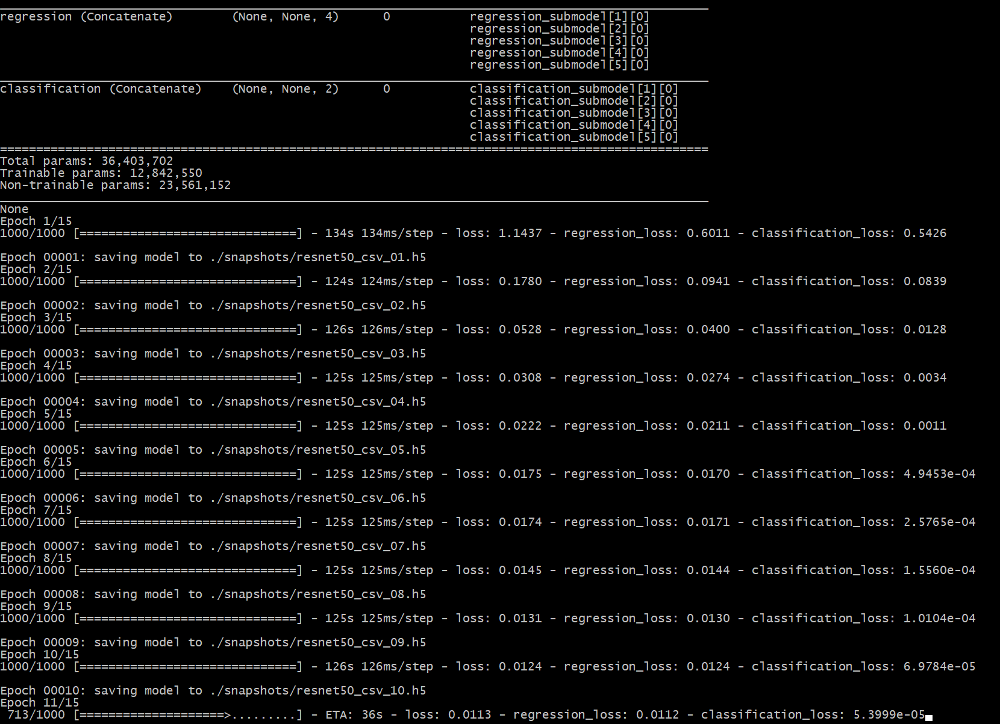



Some initialization code

In [1]:
# show images inline
%matplotlib inline

# automatically reload modules when they have changed
%load_ext autoreload
%autoreload 2

# import keras
import keras

# import keras_retinanet
from keras_retinanet import models
from keras_retinanet.utils.image import read_image_bgr, preprocess_image, resize_image
from keras_retinanet.utils.visualization import draw_box, draw_caption
from keras_retinanet.utils.colors import label_color

# import miscellaneous modules
import matplotlib.pyplot as plt
import cv2
import os
import numpy as np
import time

# set tf backend to allow memory to grow, instead of claiming everything
import tensorflow as tf

def get_session():
    config = tf.ConfigProto()
    config.gpu_options.allow_growth = True
    return tf.Session(config=config)

# use this environment flag to change which GPU to use
#os.environ["CUDA_VISIBLE_DEVICES"] = "1"

# set the modified tf session as backend in keras
keras.backend.tensorflow_backend.set_session(get_session())

/anaconda/envs/py35/lib/python3.5/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


Load in the model which we have created, and we specify that we used the resnet 50 backbone. Note this is AFTER we convert the training model to an inference model

In [106]:
# adjust this to point to your downloaded/trained model
# models can be downloaded here: https://github.com/fizyr/keras-retinanet/releases
model_path = os.path.join('helmets-2.h5')

# load retinanet model
model = models.load_model(model_path, backbone_name='resnet50')

/anaconda/envs/py35/lib/python3.5/site-packages/keras/engine/saving.py:292: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


Create a mapping from our label IDs to class names

In [25]:
label_map = { 0: 'NOTHELMET', 1: 'HELMET' }

Our main predict function i.e. use our model to predict the scores, labels and bounding boxes then plot

In [107]:
def predictImage(path):

    # load image
    image = read_image_bgr(path)

    #safety_images/480986.jpg

    # copy to draw on
    draw = image.copy()
    draw = cv2.cvtColor(draw, cv2.COLOR_BGR2RGB)

    # preprocess image for network
    image = preprocess_image(image)
    image, scale = resize_image(image)

    # process image
    start = time.time()
    boxes, scores, labels = model.predict_on_batch(np.expand_dims(image, axis=0))
    print("processing time: ", time.time() - start)

    # correct for image scale
    boxes /= scale

    # visualize detections
    for box, score, label in zip(boxes[0], scores[0], labels[0]):
        # scores are sorted so we can break
        if score < 0.5:
            break

        color = label_color(label)

        b = box.astype(int)
        draw_box(draw, b, color=color)

        caption = "{} {:.3f}".format(label_map[label], score)
        draw_caption(draw, b, caption)

    plt.figure(figsize=(15, 15))
    plt.axis('off')
    plt.imshow(draw)
    plt.show()

Let's plot an image an example, seems to work well!

processing time:  0.816572904586792


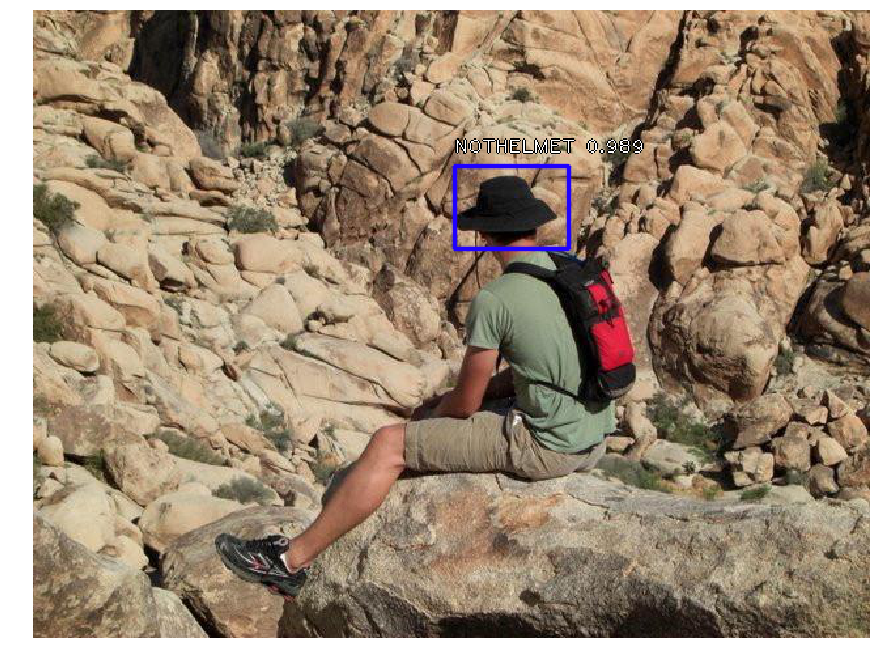

In [108]:
predictImage('safety_images/481976.jpg')

We should be slightly more rigourous i.e. let's ensure we are not testing on an image which we have trained on, that would be cheating. We will compute a list of images which we know we have not trained on.

In [109]:
import re
from os import listdir
from pipe import *

# which images have we trained on?
with open('annotations.csv', 'r') as f:
    annotations = f.readlines() \
        | select( lambda l: ( re.search('\d+\.JPG(?i)', l).group(), 1 ) ) \
        | as_dict

# which images from safety_images are OK to test on i.e. we didn't train on them?
test_images = listdir('safety_images') \
    | select( lambda l: re.search('\d+\.JPG(?i)', l).group() ) \
    | where( lambda f: f not in annotations ) \
    | as_list 


Now let's choose 10 of those images at random and predict them

processing time:  0.05315852165222168


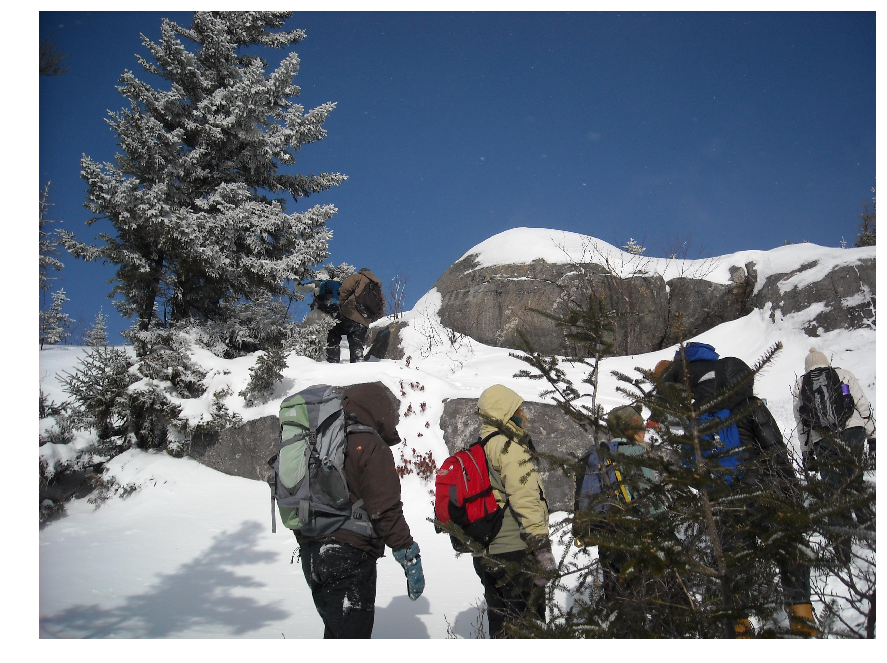

processing time:  0.0514979362487793


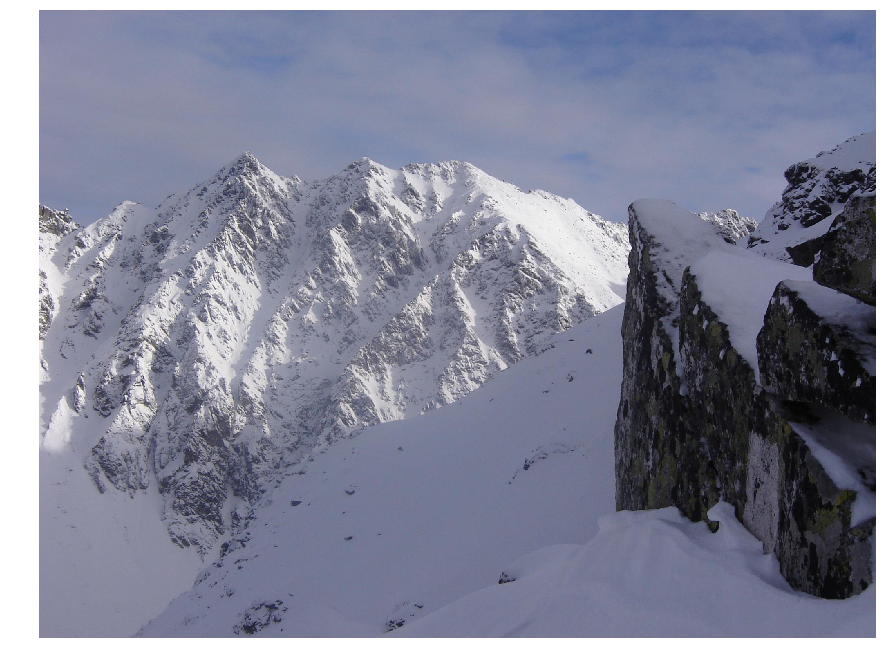

processing time:  0.05415654182434082


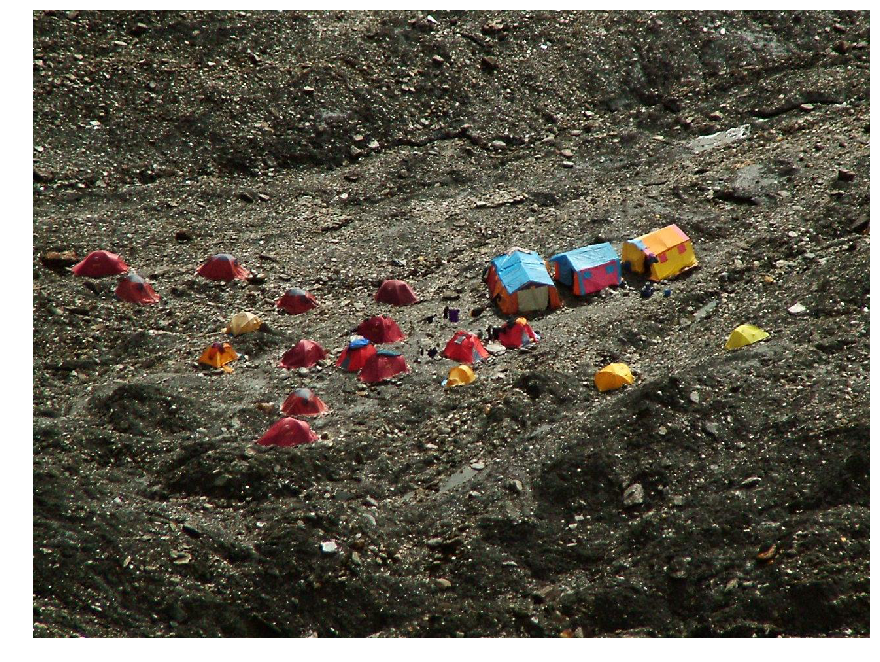

processing time:  0.05283308029174805


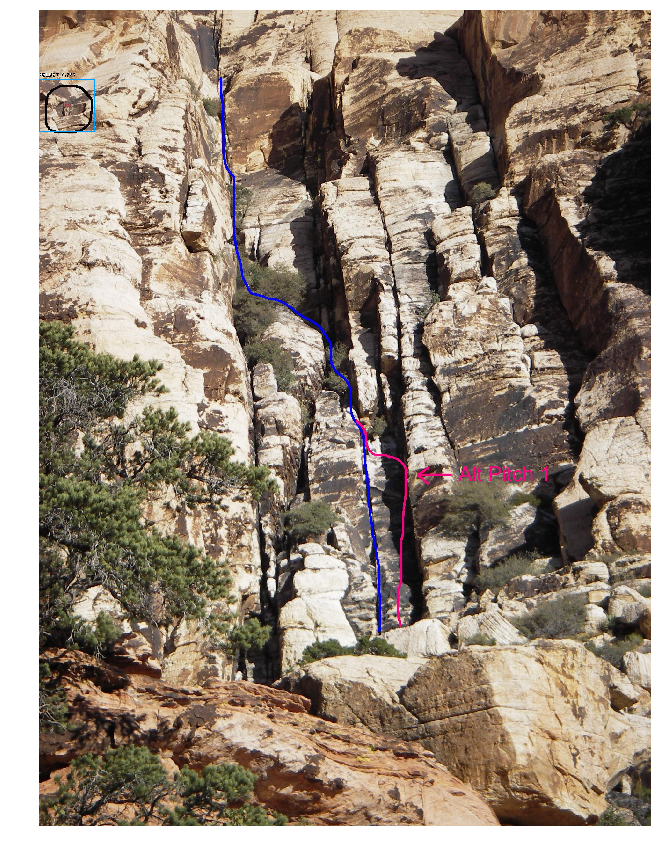

processing time:  0.05265974998474121


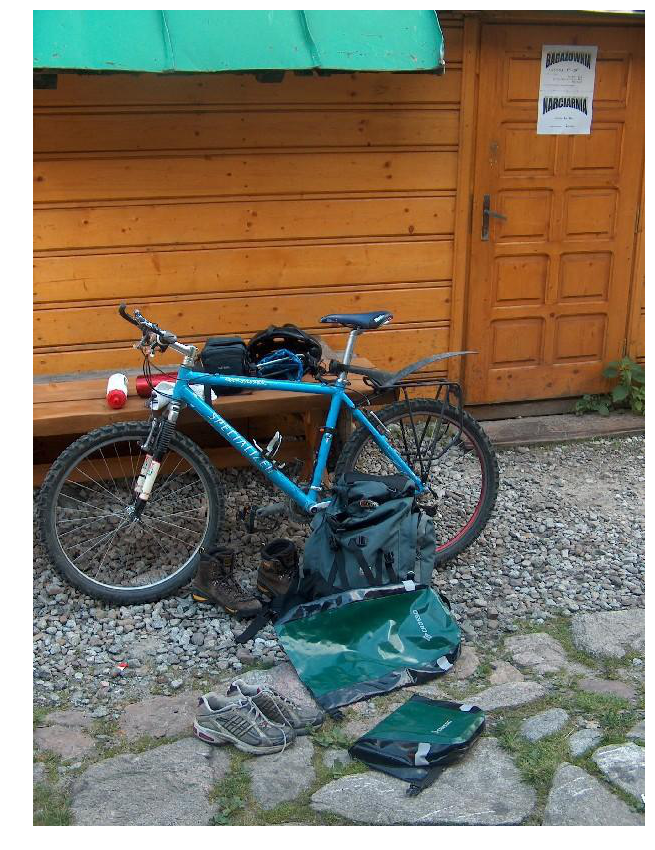

processing time:  0.05660390853881836


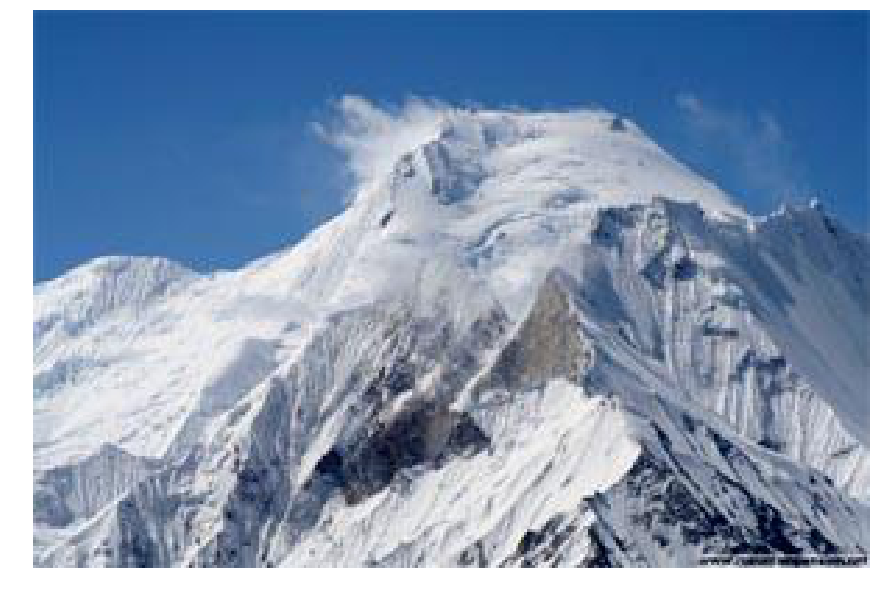

processing time:  0.05281352996826172


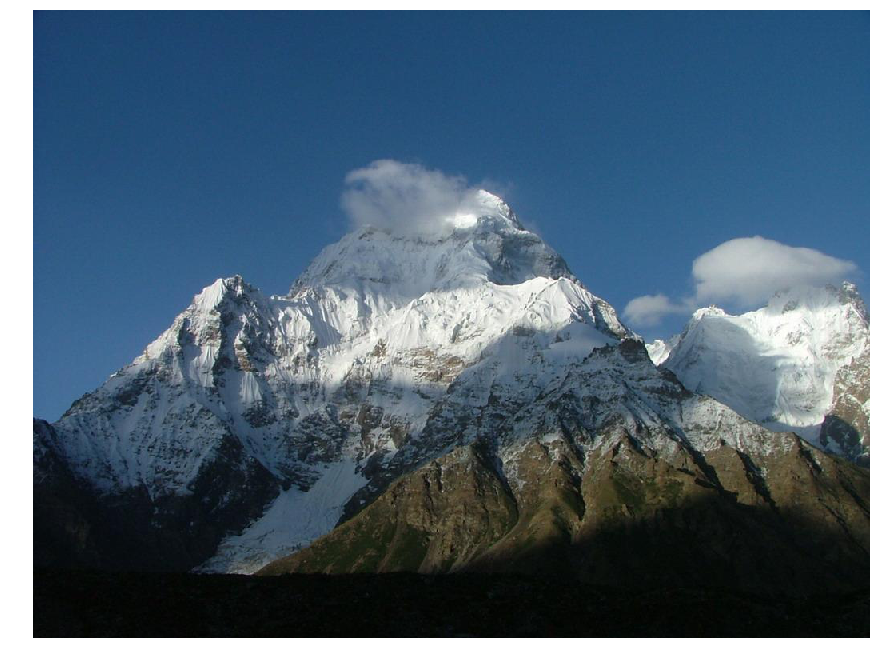

processing time:  0.40682435035705566


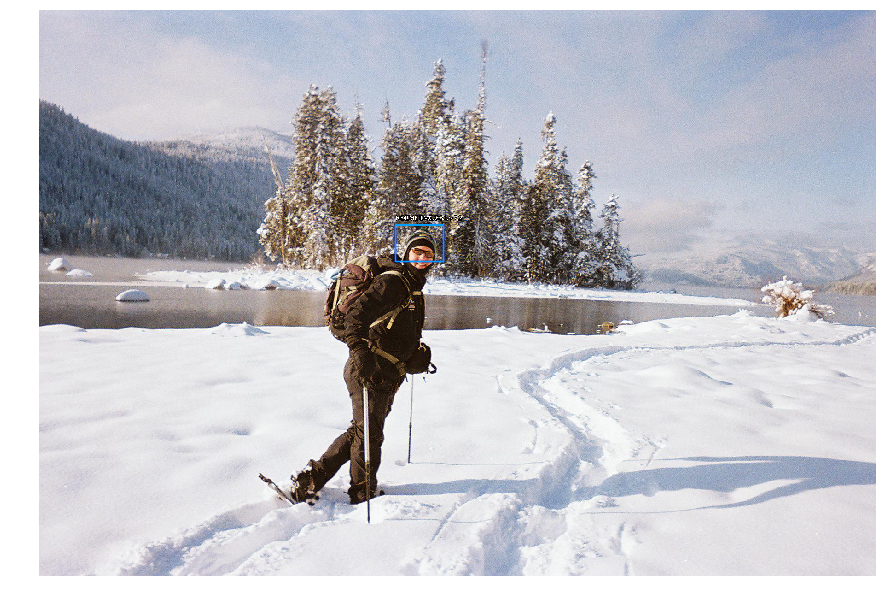

processing time:  0.04845547676086426


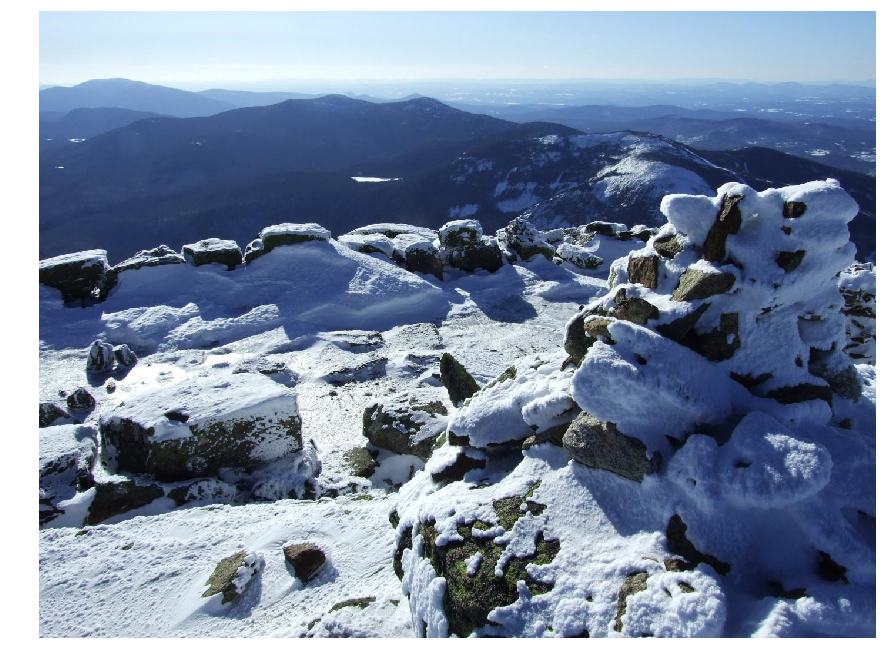

processing time:  0.048134803771972656


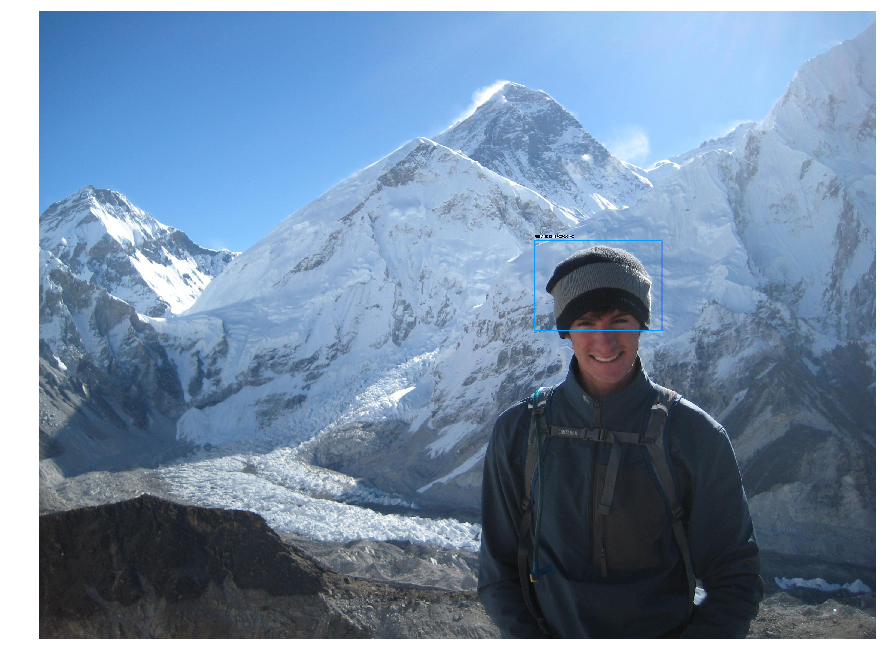

In [112]:
# choose 10 randomly and predict them
import random

@Pipe
def pshuffle(l):
    random.shuffle(l)
    for i in l: yield i

test_batch = test_images \
    | pshuffle \
    | take(10) \
    | select( lambda p: os.path.join('./safety_images/',p) ) \
    | as_list

for image in test_batch:
    predictImage(image)